In [ ]:
!pip install -q torchmetrics

In [ ]:
import numpy as np
import os
import pandas as pd
import time
from collections import defaultdict

import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from PIL import Image
import seaborn as sns
sns.set(palette='Set2')

import albumentations as A
from torchvision import transforms

import torch
from torch.utils.data import Dataset, DataLoader
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from torchmetrics.detection.mean_ap import MeanAveragePrecision
device = "cuda" if torch.cuda.is_available() else "cpu"

## Задача 1. Single Shot Multibox Detector (SSD)

#### 1. Данные



Скачаем данные с github.

In [ ]:
!git clone https://github.com/EdjeElectronics/TensorFlow-Object-Detection-API-Tutorial-Train-Multiple-Objects-Windows-10.git
!cp -r "TensorFlow-Object-Detection-API-Tutorial-Train-Multiple-Objects-Windows-10/images" .
!rm -r "TensorFlow-Object-Detection-API-Tutorial-Train-Multiple-Objects-Windows-10"

Cloning into 'TensorFlow-Object-Detection-API-Tutorial-Train-Multiple-Objects-Windows-10'...
remote: Enumerating objects: 1235, done.
remote: Counting objects: 100% (36/36), done.
remote: Compressing objects: 100% (27/27), done.
remote: Total 1235 (delta 17), reused 24 (delta 8), pack-reused 1199
Receiving objects: 100% (1235/1235), 57.70 MiB | 28.99 MiB/s, done.
Resolving deltas: 100% (627/627), done.


В папке `images` содержатся папки с изображениями для обучения и тестирования: `train` и `test` соответственно. Также в `images` есть таблицы с классами и
координатами ограничивающих прямоугольников `train_labels.csv` и `test_labels.csv`. Рассмотрим одну из таблиц с разметкой.

In [ ]:
data = pd.read_csv("images/train_labels.csv")
data.head()

,filename,width,height,class,xmin,ymin,xmax,ymax
0,cam_image1.jpg,480,270,queen,173,24,260,137
1,cam_image1.jpg,480,270,queen,165,135,253,251
2,cam_image1.jpg,480,270,ten,255,96,337,208
3,cam_image10.jpg,960,540,ten,501,116,700,353
4,cam_image10.jpg,960,540,queen,261,124,453,370


Сразу заметим, что картинки в датасете разного размера.

Определим функцию, которая по названию файла выдает лейбл и координаты боксов.

In [ ]:
def get_file_labels_boxes(data, file):
    """
    Функция, которая по названию файла выдает лейбл и координаты боксов.
    Аргументы:
      data -- датафрейм с данными;
      file -- название файла.
    Возвращает:
      labels и boxes -- лейблы классов и координаты боксов
      в формате xmin, ymin, xmax, ymax.
    """
    part_data = data.where(data["filename"] == file).dropna(how='any', axis=0)
    labels = [class2label[class_] for class_ in part_data["class"].values]
    boxes = part_data[["xmin", "ymin", "xmax", "ymax"]].values
    return labels, boxes

Всего в данных 6 классов карт. Добавим к ним класс фона `bg`. Он понадобится нам для работы с SSD.

In [ ]:
n_classes = 7
classes = ['bg', 'nine', 'ten', 'jack', 'queen', 'king', 'ace', 'bg',]
class2label = {'bg': 0, 'nine': 1, 'ten': 2, 'jack': 3, 'queen': 4, 'king': 5, 'ace': 6}

Посмотрим как выглядят наши данные в целом. Визуализируем картинки и соответствующие им боксы. Для этого будем использовать следующую функцию отрисовки. Вы можете далее изменять ее как вам будет удобнее.

In [ ]:
def plot_boxes(
    boxes, labels, classes, ax, edgecolor='red', scores=None, threshold=None
    ):
    """
    Функция отрисовки bounding box-ов в задаче детекции.
    Аргументы:
      boxes -- массив боксов, которые задаются координатами
      xmin, ymin, xmax, ymax;
      labels -- лейблы классов;
      scores -- уверенность модели в детекции боксов;
      threshold -- порог отсечения боксов по threshold;
      ax -- полотно, на котором отображена исходная картинка.
    """

    box_kwargs = dict(linewidth=2, fill=False, edgecolor=edgecolor, facecolor='none')
    bbox = dict(facecolor='white', alpha=0.5)
    annot_kwargs = dict(color='black', size=14, bbox=bbox)

    for i, box in enumerate(boxes):

        if (scores is not None) and (threshold is not None) and (scores[i] < threshold):
            continue

        left_x, top_y, right_x, bottom_y = box
        width = right_x - left_x + 1
        height = bottom_y - top_y + 1

        # Прямоугольная рамка
        box_patch = Rectangle((left_x, top_y), width=width, height=height, **box_kwargs)
        # Добавляем рамку к изображению
        ax.add_patch(box_patch)

        # Добавляем текст к фото справа сверху от рамки
        if scores is not None:
            ax.text(left_x, top_y, f"{classes[labels[i]]}, {scores[i]:.2f}", **annot_kwargs)
        else:
            ax.text(left_x, top_y, f"{classes[labels[i]]}", **annot_kwargs)

Визуализируем 20 картинок из тренировочных данных.

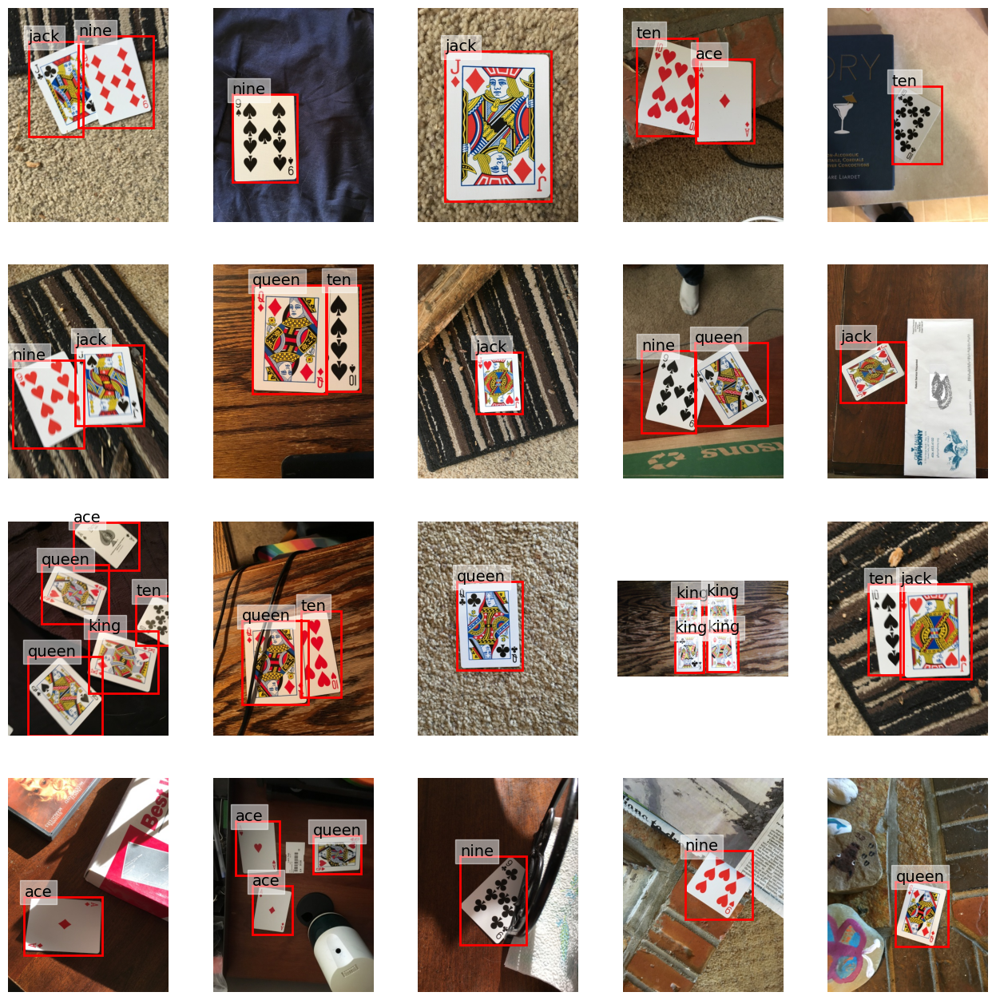

In [ ]:
files = os.listdir("images/train")

fig, axes = plt.subplots(4, 5, figsize=(16, 16))

# Итератор по изображениям
i = 0
# Итератор по файлам
j = 0
while i < 20:

    file = files[j]
    j += 1

    # Выбираем только картинки
    if file[-4:].lower() != ".jpg":
        continue
    img = Image.open(os.path.join("images/train", file))

    # Получаем лейблы и боксы, соотв. картинке
    labels, boxes = get_file_labels_boxes(data, file)

    # Визуализируем
    ax = axes[i // 5, i % 5]
    ax.imshow(img)
    plot_boxes(boxes, labels, classes, ax)
    ax.axis("off")

    i += 1

Для модели SSD300 нужны на вход картинки размера 300 x 300. Причем здесь нам не помогут разные трансформации из `torchvision.transforms`, так как нам нужно изменять еще и боксы. К нам в помощь приходит библиотека [Albumentations](https://albumentations.ai/docs/). Подробнее посмотреть как работать с библиотекой в случае детекции можно [тут](https://albumentations.ai/docs/examples/example_bboxes/).

In [ ]:
def spec_crop(image, boxes):
    """
    Функция, которая обрезает изображения до квадрата так,
    чтобы все боксы по возможности остались внутри квадрата.
    Полученные картинки приводятся к размеру 300x300.
    """

    # Вычисляем границы всех боксов вместе
    x_min = boxes[:, 0].min()
    y_min = boxes[:, 1].min()
    x_max = boxes[:, 2].max()
    y_max = boxes[:, 3].max()

    # Ширина и высота изображения
    h, w = image.size
    # Размер квадрата, до которого мы обрежем изображение
    size = min(h, w)
    half_size = size // 2

    # x-координата центра прямоугольника, ограничивающего все боксы
    x_ctr = (x_max - x_min) // 2 + x_min
    # По ней мы вычисляем x_min и x-max -- координаты квадрата,
    # который мы вырежем из исходного изображения,
    # чтобы получить квадратное изображение.
    if x_ctr < half_size:
        x_min = 0
        x_max = size - 1
    elif x_ctr + half_size >= h:
        x_max = h - 1
        x_min = x_max - size + 1
    else:
        x_min = x_ctr - half_size
        x_max = int(x_min + size) - 1

    # y-координата центра прямоугольника, ограничивающего все боксы
    y_ctr = (y_max - y_min) // 2 + y_min
    # По ней мы вычисляем y_min и y-max -- координаты квадрата,
    # который мы вырежем из исходного изображения,
    # чтобы получить квадратное изображение.
    if y_ctr < half_size:
        y_min = 0
        y_max = size - 1
    elif y_ctr + half_size >= w:
        y_max = w - 1
        y_min = y_max - size + 1
    else:
        y_min = y_ctr - half_size
        y_max = int(y_min + size) - 1

    # Приводим все координаты к int
    x_min, y_min, x_max, y_max = int(x_min), int(y_min), int(x_max), int(y_max)

    # Обрезаем изображение до квадрата и изменяем размер, полученного изображения
    transform = A.Compose([
        A.Crop(x_min, y_min, x_max, y_max),
        A.Resize(300, 300),
    ], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels'])
    )
    transformed = transform(image=np.array(image), bboxes=boxes, labels=labels)
    image, boxes = transformed["image"], transformed["bboxes"]

    return image, boxes

Допустим, мы ограничились выше функцией `spec_crop`. Положим все обрезанные картинки в новую папку cropped_images.



In [ ]:
def change_file_boxes(data, file, boxes):
    """Функция, которая изменяет координаты боксов."""
    data.loc[data["filename"] == file, ["xmin", "ymin", "xmax", "ymax"]] = boxes


dir = "images"
res_dir = "cropped_images"
os.makedirs(res_dir, exist_ok=True)

for part in ["train", "test"]:
    # Создаем папку, если ее нет
    os.makedirs(os.path.join(res_dir, part), exist_ok=True)

    # Названия файлов с картинками и таблица с разметкой
    files = os.listdir(os.path.join(dir, part))
    data = pd.read_csv(os.path.join(dir, f"{part}_labels.csv"))

    for file in files:

        # Выбираем только картинки
        if file[-4:].lower() != ".jpg":
            continue
        image = Image.open(os.path.join(dir, part, file))

        # Получаем лейблы и координаты боксов
        labels, boxes = get_file_labels_boxes(data, file)

        # Обрезаем картинку
        image, boxes = spec_crop(image, boxes)

        # Сохраняем результат обрезки
        plt.imsave(os.path.join(res_dir, part, file), image)
        change_file_boxes(data, file, boxes)

    data.to_csv(os.path.join(res_dir, f"{part}_labels.csv"))

Предлагаем вам класс датасета, который будет хранить все картинки, боксы и лейблы в памяти. К счастью, их немного, зато такой подход будет быстрее работать. В данном случае скорость критична, в виду долгой работы сети в целом.

In [ ]:
class PlayingCardsDataset(Dataset):
    def __init__(self, images_path, data_path, input_size=(160, 240)):
        """
        Класс-датасет для задачи детекции игральных карт.
        """

        self.transform = transforms.Compose([
            transforms.ToTensor(),
            # Решайте сами, когда и зачем вам нужан нормализация
            transforms.Normalize(
                mean = [0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225]
            )
        ])

        images, boxes, labels = self._read_images_boxes_labels(images_path, data_path)
        self.images = images
        self.boxes = boxes
        self.labels = labels


    def _read_images_boxes_labels(self, images_path, data_path):
        """
        Загружаем все изображения, а также соотвествующие им боксы и лейблы.
        """
        data = pd.read_csv(data_path)

        images = []
        boxes = []
        labels = []

        for file in os.listdir(images_path):
            image =  self.transform(Image.open(os.path.join(images_path, file)))
            labels_, boxes_ = get_file_labels_boxes(data, file)
            images.append(image)
            labels.append(torch.tensor(labels_))
            # Все координаты боксов делим на 300,
            # потому что в SSD используются относительные координаты.
            boxes.append(torch.tensor(boxes_) / 300)

        return images, boxes, labels

    def __len__(self,):
        return len(self.images)

    def __getitem__(self, idx):
        return self.images[idx], self.boxes[idx], self.labels[idx]

Но есть одна загвоздка, просто так такой датасет в даталоадер не положишь, потому что он будет пытаться стекать лейблы и боксы. Однако для каждой картинки у нас разное число объектов, поэтому стекать не получится. Для этого нужно определить collate функцию, которая будет определять, как даталоадеру объединять данные в батч.

In [ ]:
def collate_fn(batch):
    """
    Эта функция поясняет как комбинировать данные в батч.
    Для этого мы будем использовать списки.
    Аргумент:
      batch: итерируемый объект из __getitem__()
    Возвращает:
      тензор картинок
    """

    images = []
    boxes = []
    labels = []

    for b in batch:
        images.append(b[0])
        boxes.append(b[1])
        labels.append(b[2])

    images = torch.stack(images)

    return images, boxes, labels

Таким образом мы можем получить даталоадер для обучающих данных.

In [ ]:
batch_size = 16
train_dataset = PlayingCardsDataset(
    images_path="cropped_images/train",
    data_path="cropped_images/train_labels.csv"
)
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, pin_memory=True, collate_fn=collate_fn)

Для тестовых данным нам хватит датасета.

In [ ]:
test_dataset = PlayingCardsDataset(
    images_path="cropped_images/test",
    data_path="cropped_images/test_labels.csv"
)

#### 2. Обучение SSD300
- Обучим SSD300 на датасете с игральными картами.
- Визуализируем график лосса при обучении.

In [ ]:
# Клонируем репозиторий
! git clone https://github.com/sgrvinod/a-PyTorch-Tutorial-to-Object-Detection.git
# Копируем все из папки a-PyTorch-Tutorial-to-Object-Detection в текущую папку
! cp a-PyTorch-Tutorial-to-Object-Detection/* . -R -n -v
# Удаляем ненужные папки
! rm -r "a-PyTorch-Tutorial-to-Object-Detection"
! rm -r img
from model import *

Добавим хранение лосса в history, уберем gradient clipping.

In [ ]:
## train.py
def train(train_loader, model, criterion, optimizer, history, epoch, n_epochs, device, print_freq=200,):
    """
    One epoch's training.
    * train_loader: DataLoader for training data
    * model: model
    * criterion: MultiBox loss
    * optimizer: optimizer
    * epoch: epoch number
    """
    model.train()  # training mode enables dropout

    batch_time = AverageMeter()  # forward prop. + back prop. time
    data_time = AverageMeter()  # data loading time
    losses = AverageMeter()  # loss

    start = time.time()

    # Batches
    for i, (images, boxes, labels,) in enumerate(train_loader):
        data_time.update(time.time() - start)

        # Move to default device
        images = images.to(device)  # (batch_size (N), 3, 300, 300)
        boxes = [b.to(device) for b in boxes]
        labels = [l.to(device) for l in labels]

        # Forward prop.
        predicted_locs, predicted_scores = model(images)  # (N, 8732, 4), (N, 8732, n_classes)

        # Loss
        loss = criterion(predicted_locs, predicted_scores, boxes, labels)  # scalar

        # Backward prop.
        optimizer.zero_grad()
        loss.backward()

        history['loss'].append(loss.detach().cpu().numpy())

        # Update model
        optimizer.step()

        losses.update(loss.item(), images.size(0))
        batch_time.update(time.time() - start)

        start = time.time()

        # Print status
        if i % print_freq == 0:
            print(f'Epoch: {epoch}/{n_epochs}\t'
                  f'Batch Time {batch_time.val:.3f} ({batch_time.avg:.3f})\t'
                  f'Data Time {data_time.val:.3f} ({data_time.avg:.3f})\t'
                  f'Loss {losses.val:.4f} ({losses.avg:.4f})\t')
    del predicted_locs, predicted_scores, images, boxes, labels  # free some memory since their histories may be stored


## utils.py
def save_checkpoint(state_path, epoch, model, optimizer, history,):
    """
    Сохраняется чек-поинт модели.

    * epoch: epoch number
    * model: model
    * optimizer: optimizer
    """
    state = {'epoch': epoch,
             'model': model,
             'optimizer': optimizer,
             'history': history,
    }
    torch.save(state, state_path)


# переписанный main из train.py
def trainer(train_dataloader,
            device="cpu",
            start_epoch=0, n_epochs=300,
            lr=1e-3, momentum=0.9, weight_decay=5e-4,
            state_path="checkpoint_ssd300.pth",
            ):
    '''Код для обучения модели'''

    # Initialize model or load checkpoint

    if not os.path.exists(state_path):
        start_epoch = 0
        model = SSD300(n_classes=n_classes)
        # Initialize the optimizer, with twice the default learning rate for biases, as in the original Caffe repo
        biases = list()
        not_biases = list()
        for param_name, param in model.named_parameters():
            if param.requires_grad:
                if param_name.endswith('.bias'):
                    biases.append(param)
                else:
                    not_biases.append(param)
        optimizer = torch.optim.SGD(
            params=[{'params': biases, 'lr': 2 * lr}, {'params': not_biases}],
            lr=lr, momentum=momentum, weight_decay=weight_decay)
        history = {'loss': []}

    else:
        checkpoint = torch.load(state_path)
        start_epoch = checkpoint['epoch'] + 1
        print('\nLoaded checkpoint from epoch %d.\n' % start_epoch)
        model = checkpoint['model']
        optimizer = checkpoint['optimizer']
        history = checkpoint['history']

    # Move to default device
    model = model.to(device)
    criterion = MultiBoxLoss(priors_cxcy=model.priors_cxcy).to(device)

    # Epochs
    for epoch in range(start_epoch, n_epochs):

        # One epoch's training
        train(train_loader=train_dataloader,
              model=model,
              criterion=criterion,
              optimizer=optimizer,
              history=history,
              epoch=epoch,
              n_epochs=n_epochs,
              device=device,
        )

        # Save checkpoint
        save_checkpoint(state_path, epoch, model, optimizer, history)

Обучим 300 эпох:

In [ ]:
trainer(
    train_dataloader,
    device=device,
    state_path='./checkpoint_ssd300.pth',
)


Loaded checkpoint from epoch 200.



/usr/local/lib/python3.10/dist-packages/torch/nn/_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='none' instead.
  warnings.warn(warning.format(ret))


Epoch: 200/300	Batch Time 8.473 (8.473)	Data Time 0.042 (0.042)	Loss 0.1380 (0.1380)	
Epoch: 201/300	Batch Time 0.475 (0.475)	Data Time 0.007 (0.007)	Loss 0.1428 (0.1428)	
Epoch: 202/300	Batch Time 0.486 (0.486)	Data Time 0.009 (0.009)	Loss 0.1265 (0.1265)	
Epoch: 203/300	Batch Time 0.481 (0.481)	Data Time 0.007 (0.007)	Loss 0.1196 (0.1196)	
Epoch: 204/300	Batch Time 0.482 (0.482)	Data Time 0.007 (0.007)	Loss 0.1387 (0.1387)	
Epoch: 205/300	Batch Time 0.493 (0.493)	Data Time 0.007 (0.007)	Loss 0.1198 (0.1198)	
Epoch: 206/300	Batch Time 0.484 (0.484)	Data Time 0.007 (0.007)	Loss 0.1586 (0.1586)	
Epoch: 207/300	Batch Time 0.487 (0.487)	Data Time 0.007 (0.007)	Loss 0.1476 (0.1476)	
Epoch: 208/300	Batch Time 0.490 (0.490)	Data Time 0.007 (0.007)	Loss 0.1380 (0.1380)	
Epoch: 209/300	Batch Time 0.491 (0.491)	Data Time 0.008 (0.008)	Loss 0.1389 (0.1389)	
Epoch: 210/300	Batch Time 0.492 (0.492)	Data Time 0.007 (0.007)	Loss 0.1351 (0.1351)	
Epoch: 211/300	Batch Time 0.501 (0.501)	Data Time 0.00

Выгрузим модель и график лосса.

In [ ]:
state = torch.load('checkpoint_ssd300.pth')
model = state['model']
loss = state['history']['loss']

Визуализируем график лосса на обучении.

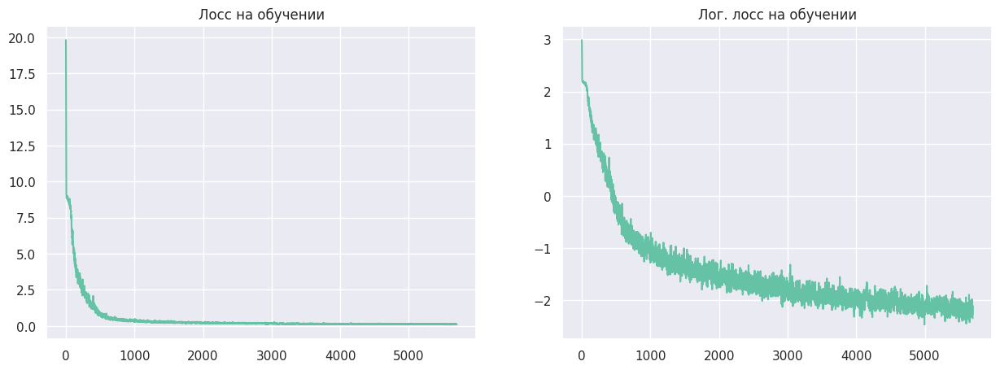

In [ ]:
loss = [l.detach().cpu().numpy() for l in loss]
plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
plt.plot(loss)
plt.title("Лосс на обучении")

plt.subplot(1, 2, 2)
plt.plot(np.log(loss))
plt.title("Лог. лосс на обучении");

#### 3. Инференс и визуализация.
- Визуализируем результаты детекции на тестовых данных.

In [ ]:
def unnormalize(image):
    '''Убирает нормализацию для визуализации'''
    image = np.array(image)
    MEAN = [0.485, 0.456, 0.406]
    STD = [0.229, 0.224, 0.225]
    image = (image * np.array(STD).reshape(1, 1, 3) \
        + np.array(MEAN).reshape(1, 1, 3)) * 255
    return image.astype(int)

def plot_predictions(dataset, model, classes, min_score=0.5, max_overlap=0.5, top_k=50):
    '''Строит предсказания model для 20 картинок из dataset
    * classes -- метки классов
    * min_score -- минимальная уверенность для засчитывания предсказания
    * max_overlap -- максимальное наложение в NMS
    * top_k -- если много наложений берем только top k предсказаний '''
    fig, axes = plt.subplots(4, 5, figsize=(20, 20))

    i = 0
    model.eval()
    for image, boxes, labels in dataset:
        if i == 20:
            break

        # Получаем предсказания
        with torch.no_grad():
            predicted_locs, predicted_scores = model(image.unsqueeze(0).to(device))
            det_boxes, det_labels, det_scores = model.detect_objects(
                predicted_locs, predicted_scores, min_score=min_score, max_overlap=max_overlap, top_k=top_k)
            det_boxes = [d.cpu() for d in det_boxes]
            det_labels = [d.cpu() for d in det_labels]
            det_scores = [d.cpu() for d in det_scores]

        # Переводим относительные размеры боксов в реальные
        boxes = [[c * 300 for c in box] for box in boxes]

        ax = axes[i // 5, i % 5]
        ax.imshow(unnormalize(image.permute(1, 2, 0)))
        plot_boxes(boxes, labels, classes, ax, scores=None, threshold=None)
        plot_boxes(det_boxes[0] * 300, det_labels[0], classes, ax, edgecolor='green', scores=det_scores[0])
        ax.axis("off")
        i += 1

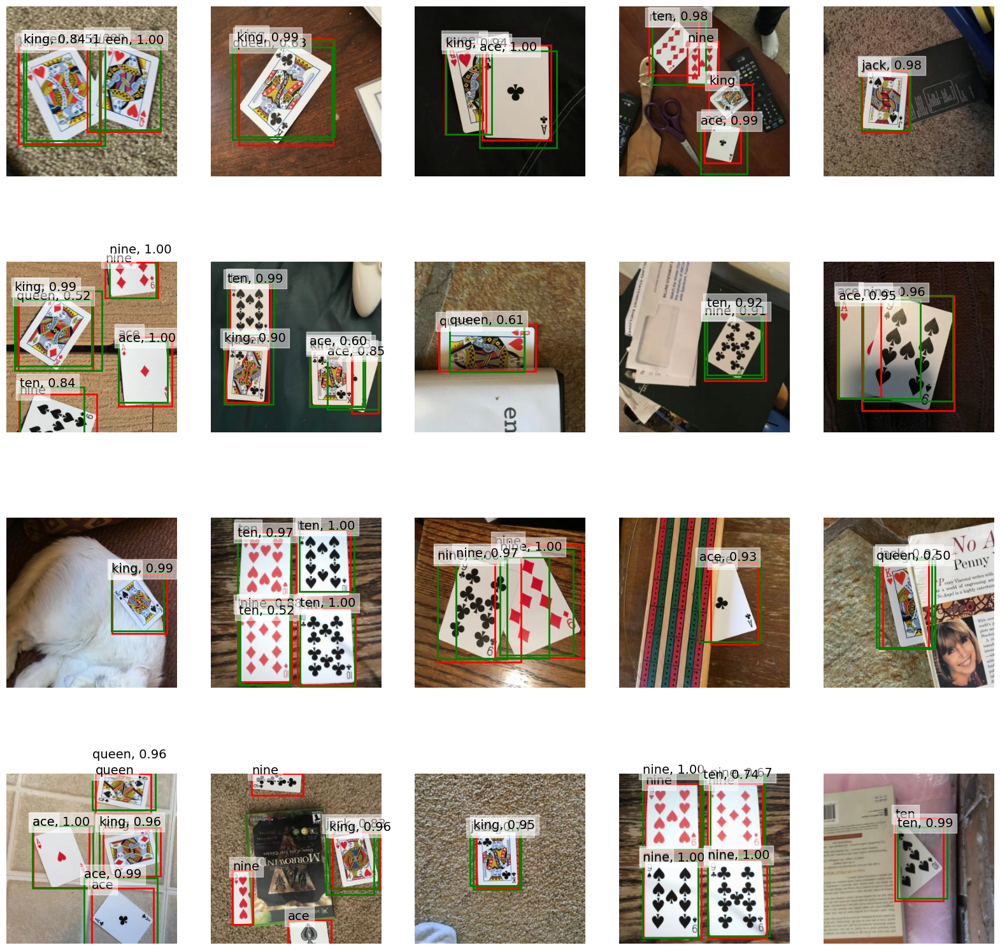

In [ ]:
plot_predictions(test_dataset, model, classes)

In [ ]:
def get_mAP(dataset, model, top_k=50, min_score=0.5, max_overlap=0.5):
    '''Подсчитывает статистики Mean Average Precision для model на dataset'''
    preds, targets = [], []
    for image, boxes, labels in dataset:
        target = defaultdict(list)
        for box, label in zip(boxes, labels):
            target['boxes'].append(box)
            target['labels'].append(label)
        target['boxes'] = torch.stack(target['boxes'])
        target['labels'] = torch.stack(target['labels'])
        targets.append(target)

        with torch.no_grad():
            predicted_locs, predicted_scores = model(image.unsqueeze(0).to(device))
            det_boxes, det_labels, det_scores = model.detect_objects(
                    predicted_locs, predicted_scores, min_score=min_score, max_overlap=max_overlap, top_k=top_k)

        # Переводим предсказания на CPU
        det_boxes, det_labels, det_scores = \
          det_boxes[0].cpu(), det_labels[0].cpu(), det_scores[0].cpu()

        pred = dict()
        pred['boxes'] = det_boxes
        pred['scores'] = det_scores
        pred['labels'] = det_labels
        preds.append(pred)

    metric = MeanAveragePrecision(iou_type="bbox")
    metric.update(preds, targets)
    return metric.compute()

In [ ]:
get_mAP(test_dataset, model)

{'map': tensor(0.4438),
 'map_50': tensor(0.7255),
 'map_75': tensor(0.5211),
 'map_small': tensor(0.4438),
 'map_medium': tensor(-1.),
 'map_large': tensor(-1.),
 'mar_1': tensor(0.4102),
 'mar_10': tensor(0.5318),
 'mar_100': tensor(0.5318),
 'mar_small': tensor(0.5318),
 'mar_medium': tensor(-1.),
 'mar_large': tensor(-1.),
 'map_per_class': tensor(-1.),
 'mar_100_per_class': tensor(-1.),
 'classes': tensor([1, 2, 3, 4, 5, 6], dtype=torch.int32)}

Реализуйте функцию для получения и визуализации Confusion matrix для детекции.

In [ ]:
def get_confusion_matrix(dataset, model, iou_threshold=0.5, matrix_labels=list(range(8)),
                         top_k=50, min_score=0.5, max_overlap=0.5):
    """
    Получает confusion matrix.

    * dataset -- датасет, для которого считается матрица.
    * model -- обученная модель.
    * iou_threshold -- порог, по которому выделяются предсказанные объекты для реальных.
    * min_score -- минимальный порог, когда бокс считается принадлежащим одному из классов.
    * max_overlap -- максимальный размер перекрытия, используемый при подавлении немаксимумов.
    * top_k -- максимальное количество предсказаний, которые мы оставляем.

    :return cm -- confusion matrix.
    """
    # Массивы для реальных и предсказанных лейблов
    true_labels = []
    pred_labels = []

    for image, boxes, labels in dataset:
        # Предсказание модели
        with torch.no_grad():
            predicted_locs, predicted_scores = model(image.unsqueeze(0).to(device))
            det_boxes, det_labels, det_scores = model.detect_objects(
                predicted_locs, predicted_scores, min_score=min_score, max_overlap=max_overlap, top_k=top_k)

        # Переводим предсказания на CPU
        det_boxes, det_labels, det_scores = \
          det_boxes[0].cpu(), det_labels[0].cpu(), det_scores[0].cpu()

        # Считаем матрицу IOU для всех пар реальных боксов с предсказанными.
        iou = find_jaccard_overlap(boxes, det_boxes)  # из utils.py

        # Выделяем те пары, где iou больше порога
        true, pred = np.where(iou > iou_threshold)
        true_labels.extend(list(labels[true]))
        pred_labels.extend(list(det_labels[pred]))

        # Также сохранеям информацию о тех объектах,
        # для которых не было предсказано ни одного бокса,
        # то есть iou со всеми < порога.
        not_found = np.where((iou > iou_threshold).sum(axis=1) == 0)[0]
        true_labels.extend(list(labels[not_found]))
        pred_labels.extend([7] * len(not_found))

    # Считаем confusion matrix
    cm = confusion_matrix(true_labels, pred_labels, normalize='true', labels=matrix_labels)
    return cm


def plot_confusion_matrix(
    dataset, model, display_labels,
    iou_threshold=0.5, matrix_labels=list(range(1, 8)),
    top_k=50, min_score=0.5, max_overlap=0.5
):
    """
    Визуализирует confusion matrix.

    * dataset -- датасет, для которого считается матрица.
    * model -- обученная модель.
    :display_labels -- лейблы, которые будут отображены в матрице.
    """
    sns.reset_orig()
    cm = get_confusion_matrix(
        dataset, model,
        iou_threshold=iou_threshold, matrix_labels=matrix_labels,
        top_k=top_k, min_score=min_score, max_overlap=max_overlap)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=display_labels)
    disp.plot()

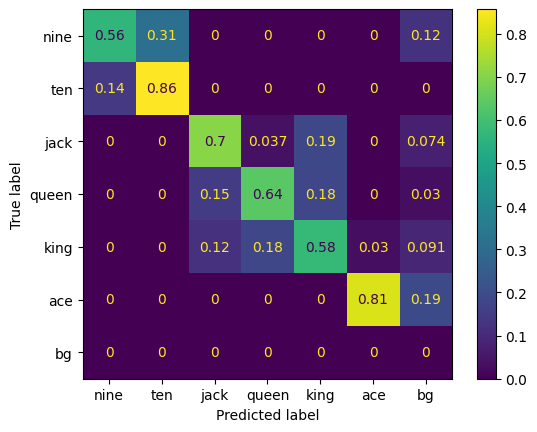

In [ ]:
plot_confusion_matrix(test_dataset, model, display_labels=classes[1:])

**Вывод:**

Лучше всего на тестовом датасете модель детектирует тузы, затем дам, затем королей и вольтов, затем 10 и хуже все справляется с девятками. При это модель иногда путает королей с вольтами, а десятки с девятками. Человек, в целом, детектирует карты похожим образом.

#### 4. Маленькие карты

Уменьшим изображения. Для этого будем случайно собирать 4 изображения из датасета и соединять их в коллаж, тем самым получая изображение с более мелкими объектами.

In [ ]:
def get_smaller_images(images, boxes):
    """
    Уменьшает изображения и соотвествующие ему боксы.

    * images -- изображения, их должно быть 4
    * boxes -- боксы, соотвествующие каждому изображению
    """
    image = torch.zeros((3, 300, 300))
    boxes = []

    transform = transforms.Resize((150, 150), antialias=True)
    for i, j in zip([0, 0, 1, 1], [0, 1, 0, 1]):
        image[:, 150 * i: 150 * (i + 1), 150 * j: 150 * (j + 1)] = transform(images[i * 2 + j])
        for box in boxes[i * 2 + j]:
            x_min, y_min, x_max, y_max = box * 0.5
            x_min += j * 0.5
            x_max += j * 0.5
            y_min += i * 0.5
            y_max += i * 0.5
            boxes.append([x_min, y_min, x_max, y_max])

    return image, boxes

Создадим целую папку с изображениями, уменьшенными выше описанным способом.

In [ ]:
dir = "cropped_images"
res_dir = "small_images"

# Создаем папку, если ее нет
os.makedirs(res_dir, exist_ok=True)

totensor = transforms.ToTensor()

for part in ["train", "test"]:
    # Создаем папку, если ее нет
    os.makedirs(os.path.join(res_dir, part), exist_ok=True)

    # Названия файлов с картинками и таблица с разметкой
    files = os.listdir(os.path.join(dir, part))
    data = pd.read_csv(os.path.join(dir, f"{part}_labels.csv"))
    new_data = pd.DataFrame(columns=['filename', 'class', 'xmin', 'ymin', 'xmax', 'ymax'])
    print(f"Количество изображений в исходных {part} данных: {len(files)}")

    if part == "train":
        num_images = 300
    else:
        num_images = 70

    for i in range(300):

        # Собираем 4 изображения
        n = 0
        images, boxes, labelss = [], [], []
        while n < 4:
            file = np.random.choice(files)
            if file[-4:].lower() != ".jpg":
                continue

            image = totensor(Image.open(os.path.join(dir, part, file)))
            labels, boxes = get_file_labels_boxes(data, file)
            images.append(image)
            # Переводим боксы в относительную шкалу
            boxes /= 300
            boxes.append(boxes)
            labelss.extend(labels)
            n += 1

        # Собираем одну картинку из нескольких маленьких
        image, boxes = get_smaller_images(images, boxes)
        boxes = [[float(c) * 300 for c in box] for box in boxes]

        # Сохраняем результат
        filename = f'image{i}.jpg'
        plt.imsave(os.path.join(res_dir, part, filename), image.permute(1, 2, 0).numpy())

        for box, label in zip(boxes, labelss):
            new_data = pd.concat([new_data, pd.DataFrame({'filename': [filename],
                                                         'class': [classes[label]],
                                                         'xmin': [box[0]], 'ymin': [box[1]],
                                                         'xmax': [box[2]], 'ymax': [box[3]]})], ignore_index=True)

    new_data.to_csv(os.path.join(res_dir, f"{part}_labels.csv"))

Количество изображений в исходных train данных: 296
Количество изображений в исходных test данных: 67


Посмотрим, что получилось.

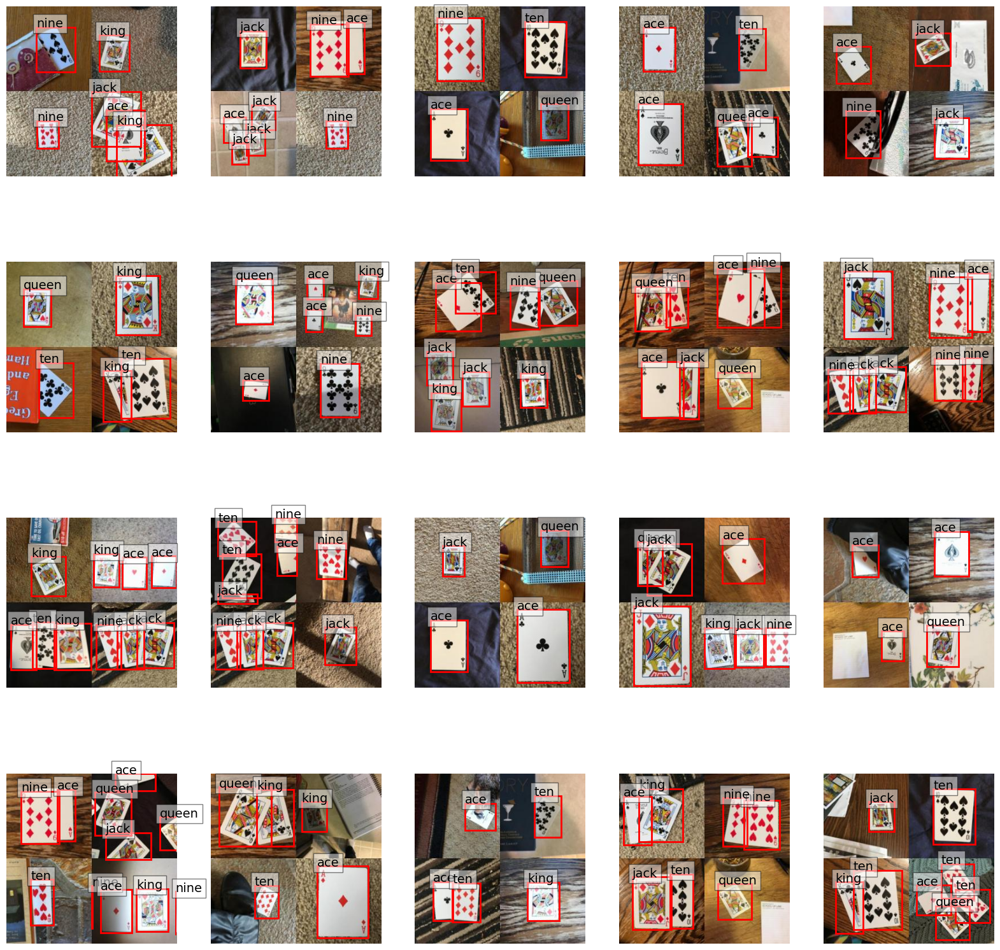

In [ ]:
files = os.listdir("small_images/train")
data = pd.read_csv("small_images/train_labels.csv")

fig, axes = plt.subplots(4, 5, figsize=(20,20))

# Итератор по изображениям
i = 0
# Итератор по файлам
j = 0
while i < 20:

    file = files[j]
    j += 1

    # Выбираем только картинки
    if file[-4:].lower() != ".jpg":
        continue
    img = Image.open(os.path.join("small_images/train", file))

    # Получаем лейблы и боксы, соотв. картинке
    labels, boxes = get_file_labels_boxes(data, file)

    # Визуализируем
    ax = axes[i // 5, i % 5]
    ax.imshow(img)
    plot_boxes(boxes, labels, classes, ax)
    ax.axis("off")

    i += 1

#### 5. Тестирование SSD на маленьких картах

In [ ]:
state = torch.load('./checkpoint_ssd300.pth')
model = state['model']

In [ ]:
test_batch_size = 16
test_dataset = PlayingCardsDataset(
    images_path="small_images/test",
    data_path="small_images/test_labels.csv"
)

/content/model.py:501: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at ../aten/src/ATen/native/IndexingUtils.h:27.)
  image_boxes.append(class_decoded_locs[1 - suppress])
/content/model.py:503: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at ../aten/src/ATen/native/IndexingUtils.h:27.)
  image_scores.append(class_scores[1 - suppress])


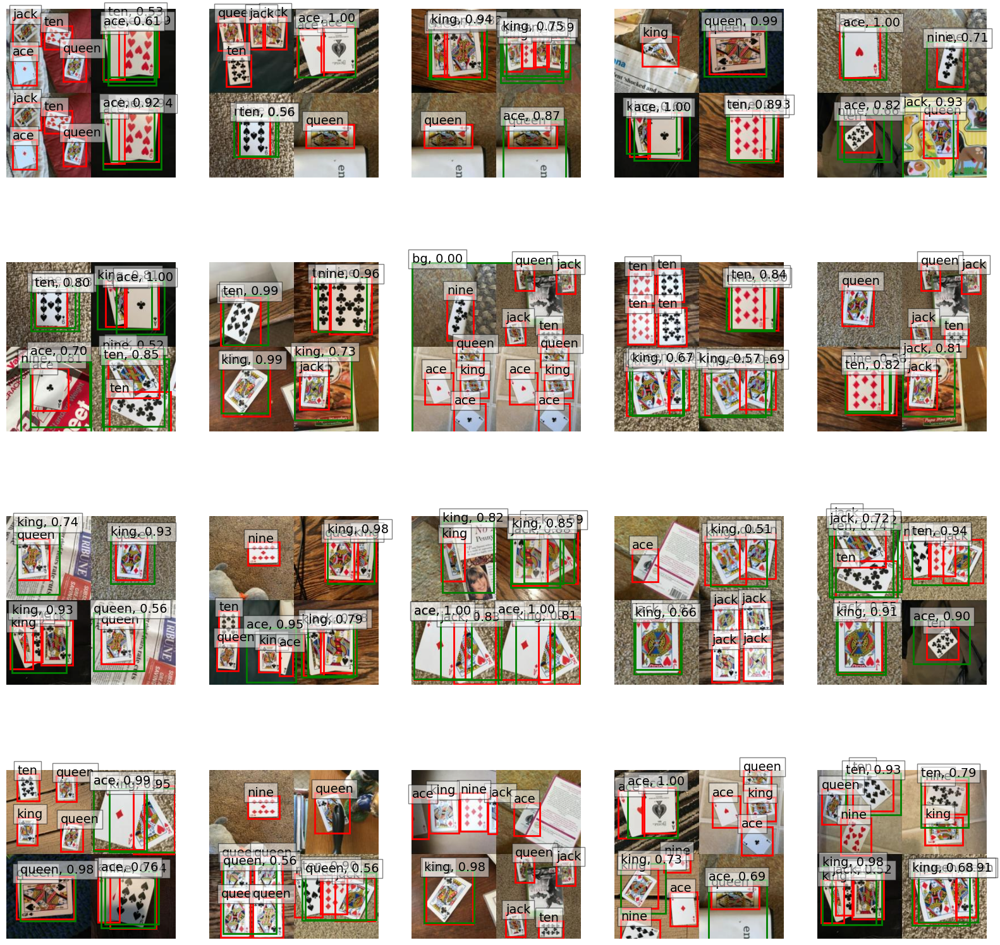

In [ ]:
plot_predictions(test_dataset, model, classes)

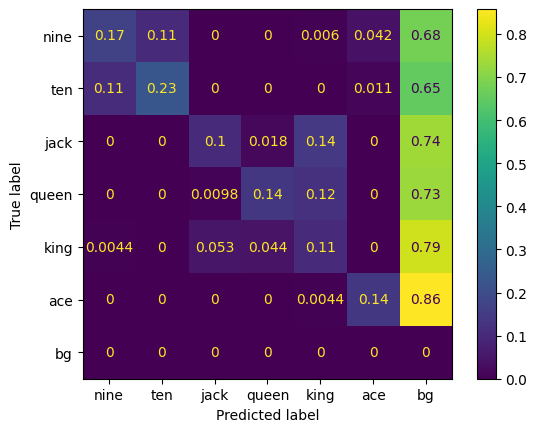

In [ ]:
plot_confusion_matrix(test_dataset, model, display_labels=classes[1:])

In [ ]:
get_mAP(test_dataset, model)

{'map': tensor(0.0434),
 'map_50': tensor(0.1062),
 'map_75': tensor(0.0320),
 'map_small': tensor(0.0434),
 'map_medium': tensor(-1.),
 'map_large': tensor(-1.),
 'mar_1': tensor(0.0610),
 'mar_10': tensor(0.0724),
 'mar_100': tensor(0.0724),
 'mar_small': tensor(0.0724),
 'mar_medium': tensor(-1.),
 'mar_large': tensor(-1.),
 'map_per_class': tensor(-1.),
 'mar_100_per_class': tensor(-1.),
 'classes': tensor([0, 1, 2, 3, 4, 5, 6], dtype=torch.int32)}

**Вывод**  
Модель очень плохо работает сейчас на маленьких объектах. Видимо выучила паттерны определенного размера. Это нас не устраивает.

#### 6. Улучшение качества распознавания для более мелких объектов

Смешаем обычные картинки и наши уменьшенные. Будем использовать такую смесь для дообучения модели.

In [ ]:
! mkdir normal_and_small_images normal_and_small_images/train
! cp cropped_images/train/* normal_and_small_images/train -R -n -v
! cp small_images/train/* normal_and_small_images/train -R -n -v

In [ ]:
data = pd.read_csv('cropped_images/train_labels.csv', index_col=0)[['filename', 'class', 'xmin', 'ymin', 'xmax', 'ymax']]
data = pd.concat([data, pd.read_csv('small_images/train_labels.csv', index_col=0)])
data.to_csv("normal_and_small_images/train_labels.csv")

In [ ]:
train_batch_size = 16
train_dataset = PlayingCardsDataset(
    images_path="normal_and_small_images/train",
    data_path="normal_and_small_images/train_labels.csv"
)
train_dataloader = DataLoader(
  train_dataset, batch_size=train_batch_size, shuffle=True, pin_memory=True, collate_fn=collate_fn)

Из feature map $FM\ 7$ размера 19x19(x1024) с помощью ряда сверток получим набор дополнительных feature map $FM\ 8_2$, $FM\ 9_2$, $FM\ 10_2$, $FM\ 11_2$ разных размеров: 10x10(x512), 5x5(x256), 3x3(x256) и 1x1(x256). Этот ряд сверток состоит из блоков сверток из 2 слоев каждый. Понижение размерности в здесь достигается путем применения stride = 2.  

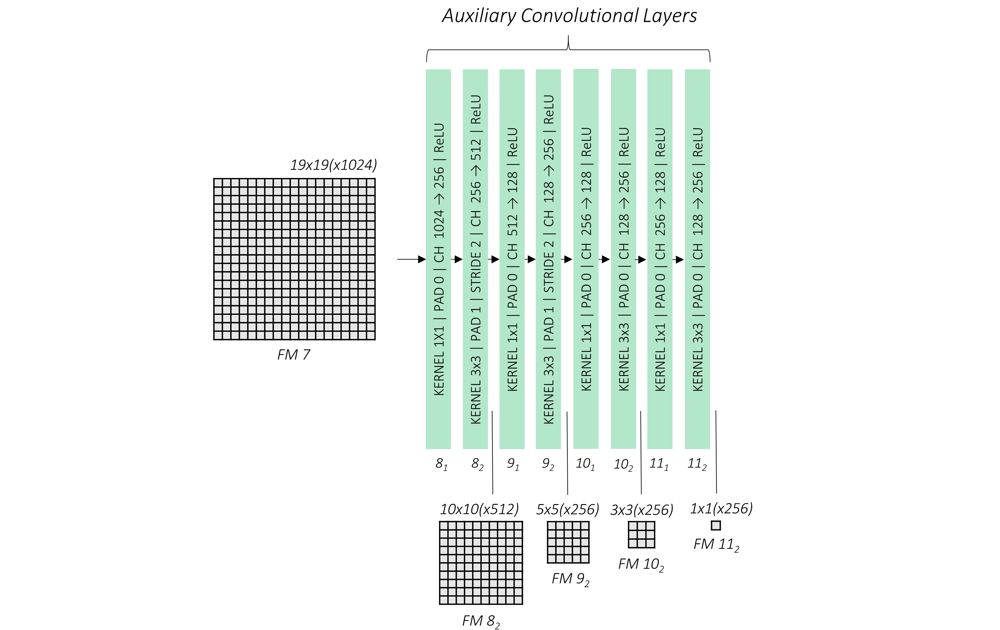

* Изменим архитектуру модели. Добавьте обратные свертки после последнего слоя `conv_11_2` в классе `AuxiliaryConvolutions`. Выходы полученных сверток нужно сделать такого же размера как feature-map-ы. Объединим их с соответствующими feature-map-ами, а результат объединения прогоните через слой conv с ядром 1x1, для каждого объединения отдельно.

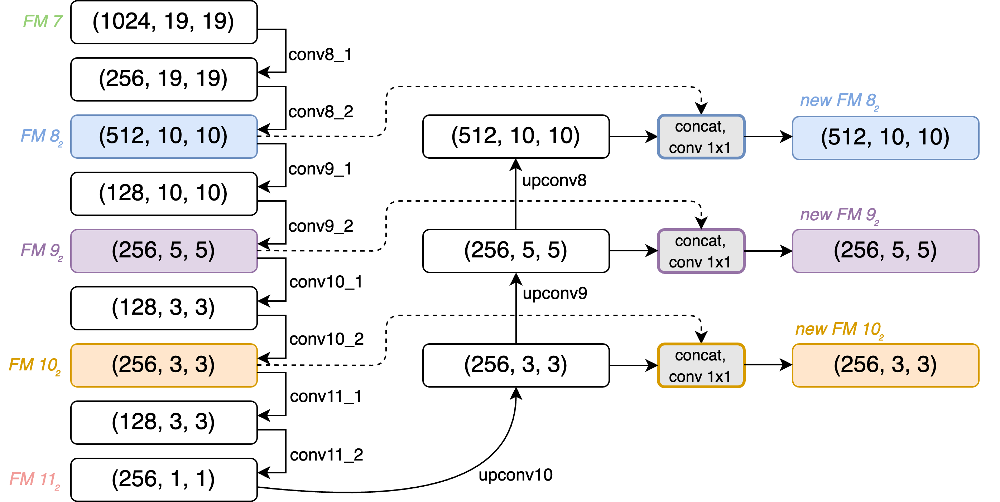

Сделаем модель, предложенную в задании и посмотрим, насколько она хороша. Ниже представлен обновленный класс `AuxiliaryConvolutions`.

In [ ]:
class AuxiliaryConvolutions(nn.Module):
    """
    Additional convolutions to produce higher-level feature maps.
    """

    def __init__(self):
        super(AuxiliaryConvolutions, self).__init__()

        # Auxiliary/additional convolutions on top of the VGG base
        self.conv8_1 = nn.Conv2d(1024, 256, kernel_size=1, padding=0)  # stride = 1, by default
        self.conv8_2 = nn.Conv2d(256, 512, kernel_size=3, stride=2, padding=1)  # dim. reduction because stride > 1

        self.conv9_1 = nn.Conv2d(512, 128, kernel_size=1, padding=0)
        self.conv9_2 = nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1)  # dim. reduction because stride > 1

        self.conv10_1 = nn.Conv2d(256, 128, kernel_size=1, padding=0)
        self.conv10_2 = nn.Conv2d(128, 256, kernel_size=3, padding=0)  # dim. reduction because padding = 0

        self.conv11_1 = nn.Conv2d(256, 128, kernel_size=1, padding=0)
        self.conv11_2 = nn.Conv2d(128, 256, kernel_size=3, padding=0)  # dim. reduction because padding = 0

        # Initialize convolutions' parameters
        self.init_conv2d()

        self.upconv10 = nn.ConvTranspose2d(256, 256, kernel_size=3)
        self.upconv9 = nn.ConvTranspose2d(256, 256, kernel_size=3)
        self.upconv8  = nn.ConvTranspose2d(256, 512, kernel_size=3, stride=2, padding=1, output_padding=1)

        self.conv8_concat = nn.Conv2d(1024, 512, kernel_size=1)
        self.conv9_concat = nn.Conv2d(512, 256, kernel_size=1)
        self.conv10_concat = nn.Conv2d(512, 256, kernel_size=1)


    def init_conv2d(self):
        """
        Initialize convolution parameters.
        """
        for c in self.children():
            if isinstance(c, nn.Conv2d):
                nn.init.xavier_uniform_(c.weight)
                nn.init.constant_(c.bias, 0.)

    def forward(self, conv7_feats):
        """
        Forward propagation.

        * conv7_feats: lower-level conv7 feature map, a tensor of dimensions (N, 1024, 19, 19)
        :return: higher-level feature maps conv8_2, conv9_2, conv10_2, and conv11_2
        """
        out = F.relu(self.conv8_1(conv7_feats))  # (N, 256, 19, 19)
        out = F.relu(self.conv8_2(out))  # (N, 512, 10, 10)
        conv8_2_out = out  # (N, 512, 10, 10)

        out = F.relu(self.conv9_1(out))  # (N, 128, 10, 10)
        out = F.relu(self.conv9_2(out))  # (N, 256, 5, 5)
        conv9_2_out = out  # (N, 256, 5, 5)

        out = F.relu(self.conv10_1(out))  # (N, 128, 5, 5)
        out = F.relu(self.conv10_2(out))  # (N, 256, 3, 3)
        conv10_2_out = out  # (N, 256, 3, 3)

        out = F.relu(self.conv11_1(out))  # (N, 128, 3, 3)
        out = F.relu(self.conv11_2(out))  # (N, 256, 1, 1)
        conv11_2_feats = out # (N, 256, 1, 1)

        out = F.relu(self.upconv10(out))
        upconv10_out = out
        out = F.relu(self.upconv9(out))
        upconv9_out = out
        out = F.relu(self.upconv8(out))
        upconv8_out = out

        conv8_feats = F.relu(self.conv8_concat(torch.cat([conv8_2_out, upconv8_out], dim=1)))
        conv9_feats = F.relu(self.conv9_concat(torch.cat([conv9_2_out, upconv9_out], dim=1)))
        conv10_feats = F.relu(self.conv10_concat(torch.cat([conv10_2_out, upconv10_out], dim=1)))

        # Higher-level feature maps
        return conv8_feats, conv9_feats, conv10_feats, conv11_2_feats

Скопируем `model.py` в файл `model_add_layers.py`. Там обновим класс `AuxiliaryConvolutions`.

In [ ]:
!cp model.py model_add_layers.py

In [ ]:
with open('model_add_layers.py', 'r') as file:
    lines = file.readlines()

with open('model_add_layers.py', 'w') as file:
    for line in lines[:129]:
        file.write(line)
    file.write(
'''
class AuxiliaryConvolutions(nn.Module):
    """
    Additional convolutions to produce higher-level feature maps.
    """

    def __init__(self):
        super(AuxiliaryConvolutions, self).__init__()

        # Auxiliary/additional convolutions on top of the VGG base
        self.conv8_1 = nn.Conv2d(1024, 256, kernel_size=1, padding=0)  # stride = 1, by default
        self.conv8_2 = nn.Conv2d(256, 512, kernel_size=3, stride=2, padding=1)  # dim. reduction because stride > 1

        self.conv9_1 = nn.Conv2d(512, 128, kernel_size=1, padding=0)
        self.conv9_2 = nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1)  # dim. reduction because stride > 1

        self.conv10_1 = nn.Conv2d(256, 128, kernel_size=1, padding=0)
        self.conv10_2 = nn.Conv2d(128, 256, kernel_size=3, padding=0)  # dim. reduction because padding = 0

        self.conv11_1 = nn.Conv2d(256, 128, kernel_size=1, padding=0)
        self.conv11_2 = nn.Conv2d(128, 256, kernel_size=3, padding=0)  # dim. reduction because padding = 0

        # Initialize convolutions' parameters
        self.init_conv2d()

        self.upconv10 = nn.ConvTranspose2d(256, 256, kernel_size=3)
        self.upconv9 = nn.ConvTranspose2d(256, 256, kernel_size=3)
        self.upconv8  = nn.ConvTranspose2d(256, 512, kernel_size=3, stride=2, padding=1, output_padding=1)

        self.conv8_concat = nn.Conv2d(1024, 512, kernel_size=1)
        self.conv9_concat = nn.Conv2d(512, 256, kernel_size=1)
        self.conv10_concat = nn.Conv2d(512, 256, kernel_size=1)


    def init_conv2d(self):
        """
        Initialize convolution parameters.
        """
        for c in self.children():
            if isinstance(c, nn.Conv2d):
                nn.init.xavier_uniform_(c.weight)
                nn.init.constant_(c.bias, 0.)

    def forward(self, conv7_feats):
        """
        Forward propagation.

        * conv7_feats: lower-level conv7 feature map, a tensor of dimensions (N, 1024, 19, 19)
        :return: higher-level feature maps conv8_2, conv9_2, conv10_2, and conv11_2
        """
        out = F.relu(self.conv8_1(conv7_feats))  # (N, 256, 19, 19)
        out = F.relu(self.conv8_2(out))  # (N, 512, 10, 10)
        conv8_2_out = out  # (N, 512, 10, 10)

        out = F.relu(self.conv9_1(out))  # (N, 128, 10, 10)
        out = F.relu(self.conv9_2(out))  # (N, 256, 5, 5)
        conv9_2_out = out  # (N, 256, 5, 5)

        out = F.relu(self.conv10_1(out))  # (N, 128, 5, 5)
        out = F.relu(self.conv10_2(out))  # (N, 256, 3, 3)
        conv10_2_out = out  # (N, 256, 3, 3)

        out = F.relu(self.conv11_1(out))  # (N, 128, 3, 3)
        out = F.relu(self.conv11_2(out))  # (N, 256, 1, 1)
        conv11_2_feats = out # (N, 256, 1, 1)

        out = F.relu(self.upconv10(out))
        upconv10_out = out
        out = F.relu(self.upconv9(out))
        upconv9_out = out
        out = F.relu(self.upconv8(out))
        upconv8_out = out

        conv8_feats = F.relu(self.conv8_concat(torch.cat([conv8_2_out, upconv8_out], dim=1)))
        conv9_feats = F.relu(self.conv9_concat(torch.cat([conv9_2_out, upconv9_out], dim=1)))
        conv10_feats = F.relu(self.conv10_concat(torch.cat([conv10_2_out, upconv10_out], dim=1)))

        # Higher-level feature maps
        return conv8_feats, conv9_feats, conv10_feats, conv11_2_feats
'''
    )
    for line in lines[186:]:
        file.write(line)

Обучим полученную модель.

In [ ]:
from model_add_layers import *
# здесь переопределить train, trainer, save_checkpoint

In [ ]:
trainer(
    train_dataloader,
    device=device,
    state_path='./checkpoint_ssd300_add_layers.pth',
)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)



Loaded base model.



/usr/local/lib/python3.10/dist-packages/torch/nn/_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='none' instead.
  warnings.warn(warning.format(ret))


Epoch: 0/300	Batch Time 7.117 (7.117)	Data Time 0.027 (0.027)	Loss 19.1939 (19.1939)	
Epoch: 1/300	Batch Time 0.520 (0.520)	Data Time 0.008 (0.008)	Loss 8.3637 (8.3637)	
Epoch: 2/300	Batch Time 0.532 (0.532)	Data Time 0.008 (0.008)	Loss 7.7499 (7.7499)	
Epoch: 3/300	Batch Time 0.522 (0.522)	Data Time 0.007 (0.007)	Loss 6.4274 (6.4274)	
Epoch: 4/300	Batch Time 0.520 (0.520)	Data Time 0.007 (0.007)	Loss 4.3276 (4.3276)	
Epoch: 5/300	Batch Time 0.520 (0.520)	Data Time 0.007 (0.007)	Loss 3.1851 (3.1851)	
Epoch: 6/300	Batch Time 0.522 (0.522)	Data Time 0.007 (0.007)	Loss 2.7878 (2.7878)	
Epoch: 7/300	Batch Time 0.539 (0.539)	Data Time 0.009 (0.009)	Loss 2.7423 (2.7423)	
Epoch: 8/300	Batch Time 0.516 (0.516)	Data Time 0.007 (0.007)	Loss 2.3855 (2.3855)	
Epoch: 9/300	Batch Time 0.520 (0.520)	Data Time 0.007 (0.007)	Loss 1.8618 (1.8618)	
Epoch: 10/300	Batch Time 0.521 (0.521)	Data Time 0.007 (0.007)	Loss 1.7718 (1.7718)	
Epoch: 11/300	Batch Time 0.529 (0.529)	Data Time 0.008 (0.008)	Loss 1.677

In [ ]:
state = torch.load('./checkpoint_ssd300_add_layers.pth')
model = state['model']
loss = state['history']['loss']

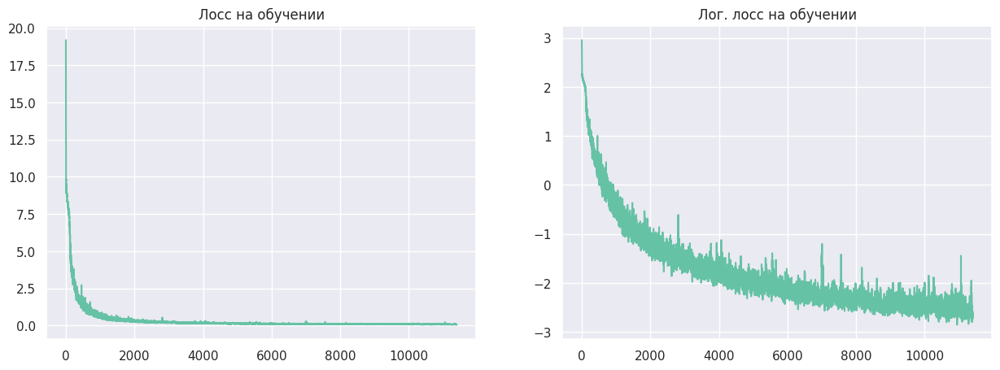

In [ ]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
plt.plot(loss)
plt.title("Лосс на обучении")

plt.subplot(1, 2, 2)
plt.plot(np.log(loss))
plt.title("Лог. лосс на обучении");

Посмотрим результаты.

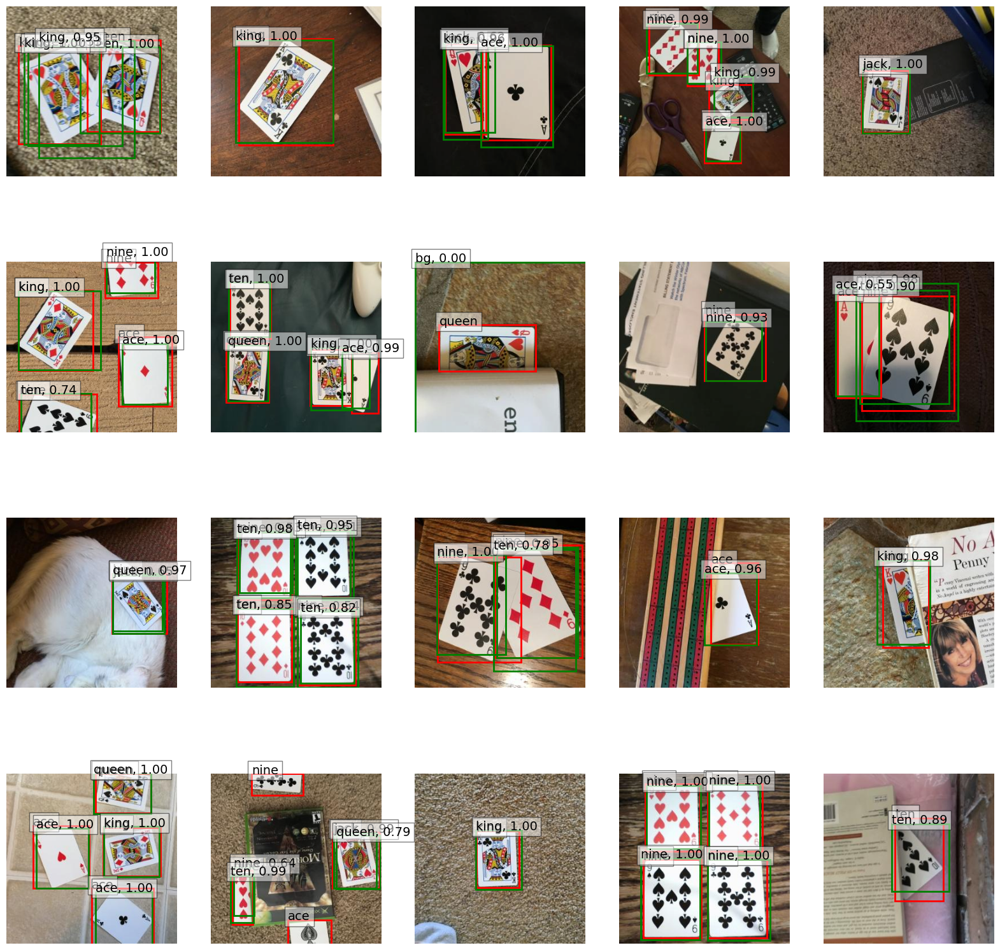

In [ ]:
plot_predictions(test_dataset, model, classes,)

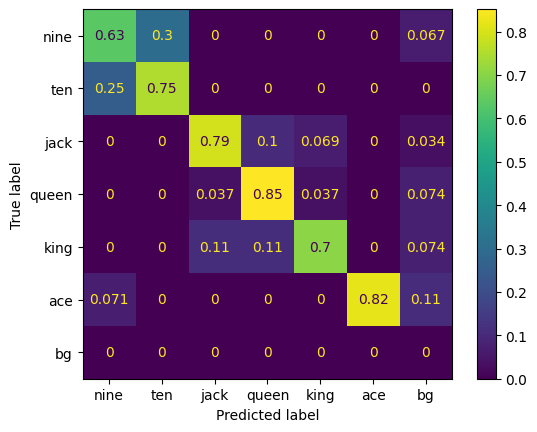

In [ ]:
plot_confusion_matrix(test_dataset, model, display_labels=classes[1:])

In [ ]:
get_mAP(test_dataset, model)

{'map': tensor(0.4808),
 'map_50': tensor(0.7833),
 'map_75': tensor(0.5690),
 'map_small': tensor(0.4808),
 'map_medium': tensor(-1.),
 'map_large': tensor(-1.),
 'mar_1': tensor(0.3107),
 'mar_10': tensor(0.5625),
 'mar_100': tensor(0.5626),
 'mar_small': tensor(0.5626),
 'mar_medium': tensor(-1.),
 'mar_large': tensor(-1.),
 'map_per_class': tensor(-1.),
 'mar_100_per_class': tensor(-1.),
 'classes': tensor([1, 2, 3, 4, 5, 6], dtype=torch.int32)}

Тестирование на исходном тестовом датасете:

In [ ]:
get_mAP(test_dataset, model)

{'map': tensor(0.5567),
 'map_50': tensor(0.8300),
 'map_75': tensor(0.6450),
 'map_small': tensor(0.5567),
 'map_medium': tensor(-1.),
 'map_large': tensor(-1.),
 'mar_1': tensor(0.4682),
 'mar_10': tensor(0.6160),
 'mar_100': tensor(0.6160),
 'mar_small': tensor(0.6160),
 'mar_medium': tensor(-1.),
 'mar_large': tensor(-1.),
 'map_per_class': tensor(-1.),
 'mar_100_per_class': tensor(-1.),
 'classes': tensor([0, 1, 2, 3, 4, 5, 6], dtype=torch.int32)}

**Вывод**  
Данная модель все объекты детектирует с более равномерным успехом чем предыдущая модель. Возможно, если обучать ее дольше, то результаты будут сильно лучше. Значит имеют место эксперименты с архитектурой.

#### 7. Вывод по всей задаче

Мы обучили одностадийный детектор SSD300 на датасете с игральными картами, измерили mAP и посчитали Confusion Matrix. После тестирования на мелких картах mAP сильно понизился, и Confusion Matrix имела много False Negative предсказаний. Мы смогли это исправить, добавив upconv слои в модель, и Confusion Matrix стала выглядеть намного лучше. Однако на сложных изображениях с наложениями модель справляется хуже.